# Setup 

In [ ]:
import os

path = "/kaggle/input/main-cotun-dataset1"
count = 0
for root, _, files in os.walk(path):
    for f in files:
        print(os.path.join(root, f))
        count += 1
        if count >= 10:  
            break
    if count >= 10:
        break

/kaggle/input/main-cotun-dataset1/cotton/fussarium_wilt/fus310.JPG
/kaggle/input/main-cotun-dataset1/cotton/fussarium_wilt/fus207.jpg
/kaggle/input/main-cotun-dataset1/cotton/fussarium_wilt/fus367.jpg
/kaggle/input/main-cotun-dataset1/cotton/fussarium_wilt/fus300.jpg
/kaggle/input/main-cotun-dataset1/cotton/fussarium_wilt/fus140.jpg
/kaggle/input/main-cotun-dataset1/cotton/fussarium_wilt/fus68.jpg
/kaggle/input/main-cotun-dataset1/cotton/fussarium_wilt/fus362.jpg
/kaggle/input/main-cotun-dataset1/cotton/fussarium_wilt/fus374.jpg
/kaggle/input/main-cotun-dataset1/cotton/fussarium_wilt/fus290.jpg
/kaggle/input/main-cotun-dataset1/cotton/fussarium_wilt/fus106.jpg


In [ ]:
import os

path = "/kaggle/input/main-cotun-dataset1"

print(" Dataset root path:", path)
print("\n Contents inside dataset folder:")


for item in os.listdir(path):
    item_path = os.path.join(path, item)
    if os.path.isdir(item_path):
        print(f"    {item}/")
    else:
        print(f"    {item}")


📂 Dataset root path: /kaggle/input/main-cotun-dataset1

📑 Contents inside dataset folder:
   📁 cotton/


In [ ]:
import os

base = "/kaggle/input/main-cotun-dataset1"

print("Contents of base dataset folder:")
for item in os.listdir(base):
    print("   ", item)


Contents of base dataset folder:
    cotton


In [ ]:
import os, glob


base = "/kaggle/input/main-cotun-dataset1"
dataset_path = os.path.join(base, "cotton")   

print(" Path to Dataset folder:", dataset_path)

# Loop through class subfolders
for subdir in sorted(os.listdir(dataset_path)):
    subpath = os.path.join(dataset_path, subdir)
    if os.path.isdir(subpath):
        image_files = glob.glob(os.path.join(subpath, "*.jpg")) + \
                      glob.glob(os.path.join(subpath, "*.jpeg")) + \
                      glob.glob(os.path.join(subpath, "*.png"))
        print(f"    {subdir}: {len(image_files)} images")


📂 Path to Dataset folder: /kaggle/input/main-cotun-dataset1/cotton
   📁 bacterial_blight: 448 images
   📁 curl_virus: 417 images
   📁 fussarium_wilt: 410 images
   📁 healthy: 425 images


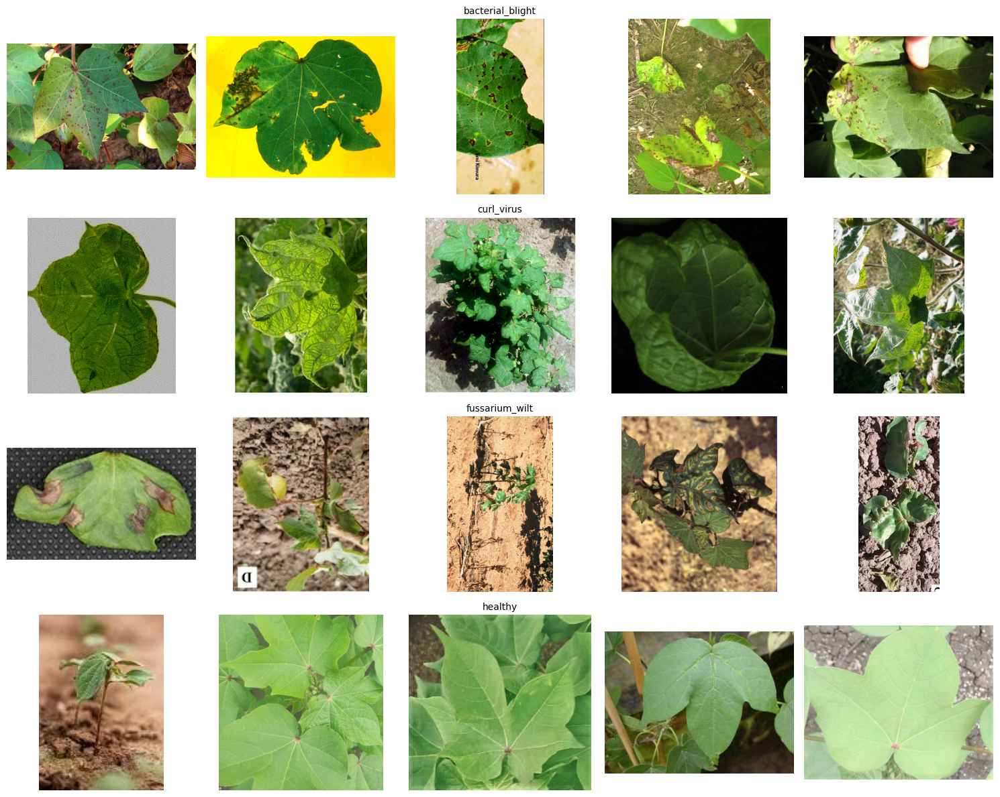

In [ ]:
import os, glob, random
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image


dataset_path = "/kaggle/input/main-cotun-dataset1/cotton"
classes = sorted([d for d in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, d))])


def list_images(cls_path):
    exts = ("*.jpg", "*.jpeg", "*.png", "*.JPG", "*.JPEG", "*.PNG")
    files = []
    for e in exts:
        files += glob.glob(os.path.join(cls_path, e))
    return sorted(files)


# Plotting
fig, axes = plt.subplots(len(classes), 5, figsize=(15, 3*len(classes)))


if len(classes) == 1:
    axes = np.expand_dims(axes, 0)

for i, cls in enumerate(classes):
    cls_path = os.path.join(dataset_path, cls)
    image_files = list_images(cls_path)
    if not image_files:
       
        for j in range(5):
            axes[i, j].axis("off")
        axes[i, 0].set_title(f"{cls} (no images)", fontsize=10)
        continue

    sample_files = random.sample(image_files, min(5, len(image_files)))

    # Turn all axes off initially
    for j in range(5):
        axes[i, j].axis("off")

    for j, img_path in enumerate(sample_files):
        try:
            img = Image.open(img_path).convert("RGB")  
            axes[i, j].imshow(np.array(img))
            axes[i, j].axis("off")
        except Exception as e:
          
            print(f" Skipping unreadable image: {img_path} ({e})")

    axes[i, 2].set_title(cls, fontsize=10)

plt.tight_layout()
plt.show()


 # images Preprocessed 

libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: cHRM chunk does not match sRGB
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: cHRM chunk does not match sRGB
libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: cHRM chunk does not match sRGB


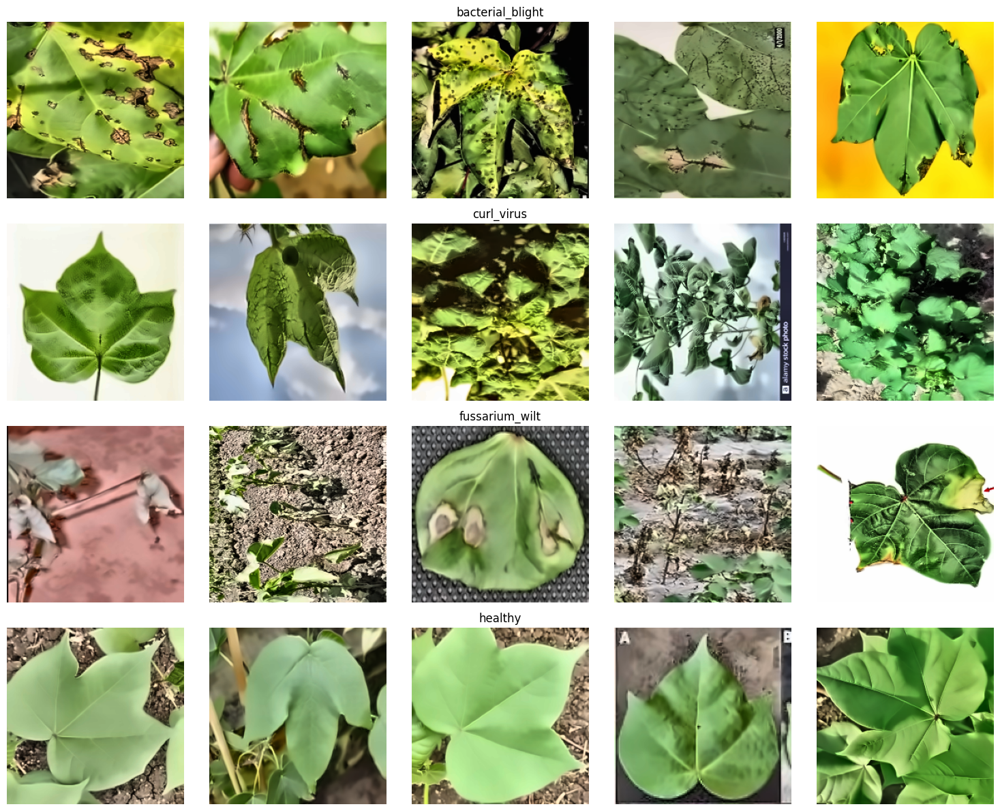

✅ Preprocessed images saved in: /kaggle/working/preprocessed_dataset
📂 Source dataset path: /kaggle/input/main-cotun-dataset1/cotton


In [ ]:
import os, glob, random
import cv2, numpy as np
import matplotlib.pyplot as plt


base = "/kaggle/input/main-cotun-dataset1"
candidates = ["cotton", "Dataset", ""]
for inner in candidates:
    test_path = os.path.join(base, inner) if inner else base
    if os.path.exists(test_path):
        input_dir = test_path
        break

output_dir = "/kaggle/working/preprocessed_dataset"
os.makedirs(output_dir, exist_ok=True)

#  Params 
img_size = (224, 224)
num_samples = 5


classes = sorted([d for d in os.listdir(input_dir) if os.path.isdir(os.path.join(input_dir, d))])
if not classes:
    raise RuntimeError(f"No class folders found under: {input_dir}")

fig, axes = plt.subplots(len(classes), num_samples, figsize=(15, 3*len(classes)))
if len(classes) == 1:
    axes = np.expand_dims(axes, 0)  

#  CLAHE for contrast enhancement 
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))

for i, cls in enumerate(classes):
    cls_path = os.path.join(input_dir, cls)
    save_cls_path = os.path.join(output_dir, cls)
    os.makedirs(save_cls_path, exist_ok=True)

    files = [f for f in os.listdir(cls_path) if f.lower().endswith((".jpg", ".jpeg", ".png"))]
    if not files:
        continue

    sample_files = random.sample(files, min(num_samples, len(files)))

    for file in files:
        img_path = os.path.join(cls_path, file)
        img = cv2.imread(img_path, cv2.IMREAD_COLOR)
        if img is None:
            continue  

        #  Resize
        img_resized = cv2.resize(img, img_size, interpolation=cv2.INTER_AREA)

        #  CLAHE on Y channel
        yuv = cv2.cvtColor(img_resized, cv2.COLOR_BGR2YUV)
        yuv[:, :, 0] = clahe.apply(yuv[:, :, 0])
        img_clahe = cv2.cvtColor(yuv, cv2.COLOR_YUV2BGR)

        # Denoise
        img_denoised = cv2.fastNlMeansDenoisingColored(
            img_clahe, None, h=10, hColor=10, templateWindowSize=7, searchWindowSize=21
        )

        # Normalize 
        img_final = (np.clip(img_denoised.astype(np.float32) / 255.0, 0, 1) * 255).astype(np.uint8)
        cv2.imwrite(os.path.join(save_cls_path, file), img_final)

       
        if file in sample_files:
            j = sample_files.index(file)
            axes[i, j].imshow(cv2.cvtColor(img_final, cv2.COLOR_BGR2RGB))
            axes[i, j].axis("off")
            if j == num_samples // 2:
                axes[i, j].set_title(cls, fontsize=12)

plt.tight_layout()
plt.show()
print(" Preprocessed images saved in:", output_dir)
print(" Source dataset path:", input_dir)


 # Dataset split into 80-10-10

In [ ]:
import os
import shutil
import random

# Preprocessed dataset path
preprocessed_dir = "/kaggle/working/preprocessed_dataset"

# Split paths
split_base = "/kaggle/working/cotton_split"
train_dir = os.path.join(split_base, "train")
val_dir   = os.path.join(split_base, "val")
test_dir  = os.path.join(split_base, "test")

# Create split folders
for d in [train_dir, val_dir, test_dir]:
    os.makedirs(d, exist_ok=True)

# Split ratios
train_ratio = 0.8
val_ratio = 0.1
test_ratio = 0.1

classes = sorted(os.listdir(preprocessed_dir))

for cls in classes:
    cls_path = os.path.join(preprocessed_dir, cls)
    files = [f for f in os.listdir(cls_path) if f.lower().endswith((".jpg", ".jpeg", ".png"))]
    random.shuffle(files)

    n_total = len(files)
    n_train = int(train_ratio * n_total)
    n_val = int(val_ratio * n_total)
    n_test = n_total - n_train - n_val

    splits = {
        train_dir: files[:n_train],
        val_dir: files[n_train:n_train+n_val],
        test_dir: files[n_train+n_val:]
    }

    for split_folder, split_files in splits.items():
        cls_split_path = os.path.join(split_folder, cls)
        os.makedirs(cls_split_path, exist_ok=True)
        for f in split_files:
            shutil.copy(os.path.join(cls_path, f), os.path.join(cls_split_path, f))

print(" Dataset split into 80-10-10 and saved in:", split_base)



✅ Dataset split into 80-10-10 and saved in: /kaggle/working/cotton_split


In [ ]:
import os

split_base = "/kaggle/working/cotton_split"
splits = ["train", "val", "test"]

for split in splits:
    split_path = os.path.join(split_base, split)
    print(f"\n {split.capitalize()} Split:")
    for cls in sorted(os.listdir(split_path)):
        cls_path = os.path.join(split_path, cls)
        num_images = len([f for f in os.listdir(cls_path) if f.lower().endswith((".jpg", ".jpeg", ".png"))])
        print(f"{cls}: {num_images} images")


📂 Train Split:
bacterial_blight: 358 images
curl_virus: 333 images
fussarium_wilt: 335 images
healthy: 340 images

📂 Val Split:
bacterial_blight: 44 images
curl_virus: 41 images
fussarium_wilt: 41 images
healthy: 42 images

📂 Test Split:
bacterial_blight: 46 images
curl_virus: 43 images
fussarium_wilt: 43 images
healthy: 43 images


# Data Augmentation

In [ ]:
import os
import cv2
import numpy as np
import random

train_dir = "/kaggle/working/cotton_split/train"
aug_train_dir = "/kaggle/working/cotton_train_aug"
os.makedirs(aug_train_dir, exist_ok=True)

# Augmentation functions
def random_flip(img):
    flip_code = random.choice([-1, 0, 1])
    return cv2.flip(img, flip_code)

def random_rotate(img):
    angle = random.uniform(-25, 25)
    h, w = img.shape[:2]
    M = cv2.getRotationMatrix2D((w//2, h//2), angle, 1)
    return cv2.warpAffine(img, M, (w, h), borderMode=cv2.BORDER_REFLECT)

def random_zoom(img):
    zoom_factor = random.uniform(0.8, 1.2)
    h, w = img.shape[:2]
    new_h, new_w = int(h*zoom_factor), int(w*zoom_factor)
    img_resized = cv2.resize(img, (new_w, new_h))
    if zoom_factor < 1:
        pad_h = (h - new_h) // 2
        pad_w = (w - new_w) // 2
        img_padded = cv2.copyMakeBorder(img_resized, pad_h, h-new_h-pad_h,
                                        pad_w, w-new_w-pad_w, cv2.BORDER_REFLECT)
        return img_padded
    else:
        start_h = (new_h - h)//2
        start_w = (new_w - w)//2
        return img_resized[start_h:start_h+h, start_w:start_w+w]

def random_brightness(img):
    factor = random.uniform(0.7, 1.3)
    img = img.astype(np.float32) * factor
    img = np.clip(img, 0, 255).astype(np.uint8)
    return img

augmentations = [random_flip, random_rotate, random_zoom, random_brightness]

# Apply augmentations
classes = sorted(os.listdir(train_dir))
for cls in classes:
    cls_path = os.path.join(train_dir, cls)
    save_cls_path = os.path.join(aug_train_dir, cls)
    os.makedirs(save_cls_path, exist_ok=True)

    for file in os.listdir(cls_path):
        if not file.lower().endswith((".jpg", ".jpeg", ".png")):
            continue
        img_path = os.path.join(cls_path, file)
        img = cv2.imread(img_path)

       
        cv2.imwrite(os.path.join(save_cls_path, file), img)

        # 3 random augmentations
        for k in range(3):
            aug_img = img.copy()
            aug_funcs = random.sample(augmentations, 2)
            for func in aug_funcs:
                aug_img = func(aug_img)
            filename, ext = os.path.splitext(file)
            aug_name = f"{filename}_aug{k+1}{ext}"
            cv2.imwrite(os.path.join(save_cls_path, aug_name), aug_img)

# Print image count per class
print("\n Image count per class after augmentation:")
for cls in classes:
    cls_path = os.path.join(aug_train_dir, cls)
    count = len([f for f in os.listdir(cls_path) if f.lower().endswith((".jpg", ".jpeg", ".png"))])
    print(f"{cls}: {count} images")

print(f"\n All train images and augmented images saved in: {aug_train_dir}")



📊 Image count per class after augmentation:
bacterial_blight: 1432 images
curl_virus: 1332 images
fussarium_wilt: 1340 images
healthy: 1360 images

✅ All train images and augmented images saved in: /kaggle/working/cotton_train_aug


# VGG19 +  Multi-Head Self-Attention (MHSA)

Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:09<00:00, 58.0MB/s] 


Epoch 1/50 | Train Loss: 0.5022, Acc: 0.8466 | Val Loss: 0.1618, Acc: 0.9524
Epoch 2/50 | Train Loss: 0.1335, Acc: 0.9632 | Val Loss: 0.0815, Acc: 0.9643
Epoch 3/50 | Train Loss: 0.0642, Acc: 0.9859 | Val Loss: 0.0503, Acc: 0.9881
Epoch 4/50 | Train Loss: 0.0347, Acc: 0.9936 | Val Loss: 0.0358, Acc: 0.9881
Epoch 5/50 | Train Loss: 0.0202, Acc: 0.9971 | Val Loss: 0.0410, Acc: 0.9881
Epoch 6/50 | Train Loss: 0.0126, Acc: 0.9989 | Val Loss: 0.0408, Acc: 0.9821
Epoch 7/50 | Train Loss: 0.0085, Acc: 0.9991 | Val Loss: 0.0452, Acc: 0.9881
Epoch 8/50 | Train Loss: 0.0056, Acc: 1.0000 | Val Loss: 0.0450, Acc: 0.9881
Epoch 9/50 | Train Loss: 0.0042, Acc: 0.9998 | Val Loss: 0.0499, Acc: 0.9881
Early stopping!

📄 Train Report:
                   precision    recall  f1-score   support

bacterial_blight     0.9986    0.9993    0.9990      1432
      curl_virus     0.9970    0.9962    0.9966      1332
  fussarium_wilt     0.9963    1.0000    0.9981      1340
         healthy     0.9970    0.9934   

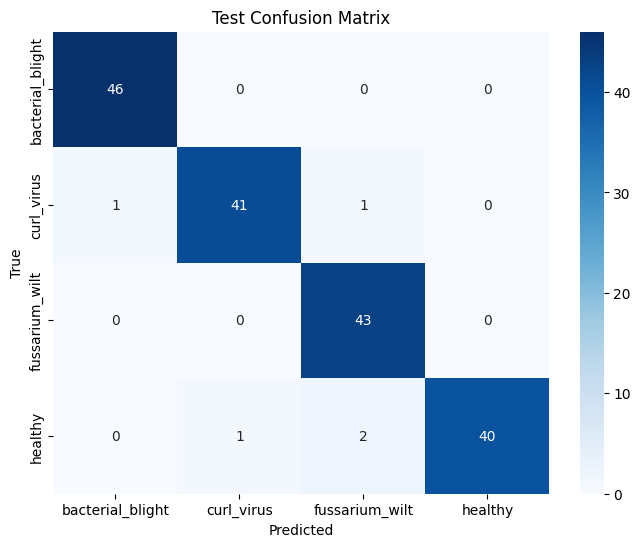


📊 ROC & PR AUC (per class):
              Class   ROC AUC    PR AUC
0  bacterial_blight  1.000000  1.000000
1        curl_virus  0.998767  0.996240
2    fussarium_wilt  1.000000  1.000000
3           healthy  0.992248  0.986688

Cohen's Kappa: 0.9619
Brier Score: 0.0104
Accuracy 95% CI: [0.9429, 0.9943]
Mean PPV (Precision): 0.9724
Mean NPV: 0.9907


In [ ]:
import os, time, psutil
import torch
from torch import nn, optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms, models
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix, cohen_kappa_score, brier_score_loss
from sklearn.metrics import roc_auc_score, average_precision_score
from scipy.stats import ttest_ind
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225])
])

train_dataset = datasets.ImageFolder('/kaggle/working/cotton_train_aug', transform=transform)
val_dataset   = datasets.ImageFolder('/kaggle/working/cotton_split/val', transform=transform)
test_dataset  = datasets.ImageFolder('/kaggle/working/cotton_split/test', transform=transform)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader   = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader  = DataLoader(test_dataset, batch_size=32, shuffle=False)

class_names = train_dataset.classes
num_classes = len(class_names)


#  Multi-Head Self-Attention
class MultiHeadSelfAttention(nn.Module):
    def __init__(self, in_channels, num_heads=4, dropout=0.3):
        super().__init__()
        assert in_channels % num_heads == 0, f"in_channels {in_channels} not divisible by num_heads {num_heads}"
        self.mha = nn.MultiheadAttention(embed_dim=in_channels, num_heads=num_heads, dropout=dropout, batch_first=True)
        self.dropout = nn.Dropout(dropout)
        self.norm = nn.LayerNorm(in_channels)

    def forward(self, x):
        b, c, h, w = x.size()
        x_flat = x.view(b, c, h*w).permute(0,2,1)   # [B, HW, C]
        attn_out, _ = self.mha(x_flat, x_flat, x_flat)
        attn_out = self.dropout(attn_out)
        attn_out = self.norm(attn_out + x_flat)
        out = attn_out.permute(0,2,1).view(b, c, h, w)
        return out


# VGG19 + MHSA
class VGG19_MHSA(nn.Module):
    def __init__(self, num_classes, num_heads=4, dropout=0.3, freeze_backbone=True):
        super().__init__()
        self.backbone = models.vgg19(weights=models.VGG19_Weights.DEFAULT).features
        if freeze_backbone:
            for p in self.backbone.parameters():
                p.requires_grad = False
        last_channels = 512
        self.mhsa = MultiHeadSelfAttention(in_channels=last_channels, num_heads=num_heads, dropout=dropout)
        self.classifier = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Flatten(),
            nn.Dropout(dropout),
            nn.Linear(last_channels, num_classes)
        )

    def forward(self, x):
        features = self.backbone(x)
        attn_features = self.mhsa(features)
        out = self.classifier(attn_features)
        return out


# Model, criterion, optimizer
model = VGG19_MHSA(num_classes=num_classes, num_heads=4, dropout=0.3).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4, weight_decay=1e-4)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=5)


# Training loop
num_epochs = 50
best_val_loss = float('inf')
patience_counter = 0

for epoch in range(num_epochs):
    model.train()
    running_loss, correct, total = 0, 0, 0
    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
        _, preds = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (preds == labels).sum().item()

    train_loss = running_loss / len(train_loader)
    train_acc = correct / total

    # Validation
    model.eval()
    val_loss, val_correct, val_total = 0, 0, 0
    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            val_loss += loss.item()
            _, preds = torch.max(outputs, 1)
            val_total += labels.size(0)
            val_correct += (preds == labels).sum().item()

    val_loss /= len(val_loader)
    val_acc = val_correct / val_total
    scheduler.step(val_loss)

    print(f"Epoch {epoch+1}/{num_epochs} | Train Loss: {train_loss:.4f}, Acc: {train_acc:.4f} | "
          f"Val Loss: {val_loss:.4f}, Acc: {val_acc:.4f}")

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model.state_dict(), "best_vgg19_mhsa.pth")
        patience_counter = 0
    else:
        patience_counter += 1
        if patience_counter >= 5:
            print("Early stopping!")
            break


#  Load best model
model.load_state_dict(torch.load("best_vgg19_mhsa.pth"))
model.eval()


# Prediction helper
def get_preds(loader):
    labels_list, preds_list, probs_list = [], [], []
    with torch.no_grad():
        for inputs, labels in loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            probs = torch.softmax(outputs, dim=1)
            _, preds = torch.max(outputs, 1)
            labels_list.extend(labels.cpu().numpy())
            preds_list.extend(preds.cpu().numpy())
            probs_list.extend(probs.cpu().numpy())
    return np.array(labels_list), np.array(preds_list), np.array(probs_list)

train_labels, train_preds, train_probs = get_preds(train_loader)
val_labels, val_preds, val_probs       = get_preds(val_loader)
test_labels, test_preds, test_probs    = get_preds(test_loader)


#  Classification Reports
print("\n Train Report:\n", classification_report(train_labels, train_preds, target_names=class_names, digits=4))
print("\n Validation Report:\n", classification_report(val_labels, val_preds, target_names=class_names, digits=4))
print("\n Test Report:\n", classification_report(test_labels, test_preds, target_names=class_names, digits=4))


#  Confusion Matrix
cm = confusion_matrix(test_labels, test_preds)
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted"); plt.ylabel("True"); plt.title("Test Confusion Matrix")
plt.show()


# ROC & PR AUC
test_labels_onehot = np.eye(num_classes)[test_labels]
roc_auc_list = [roc_auc_score(test_labels_onehot[:,i], test_probs[:,i]) for i in range(num_classes)]
pr_auc_list  = [average_precision_score(test_labels_onehot[:,i], test_probs[:,i]) for i in range(num_classes)]
print("\n ROC & PR AUC (per class):")
print(pd.DataFrame({"Class": class_names, "ROC AUC": roc_auc_list, "PR AUC": pr_auc_list}))


#  Extra Metrics with fixed bootstrap + PPV/NPV
kappa = cohen_kappa_score(test_labels, test_preds)
brier = brier_score_loss(test_labels_onehot.flatten(), test_probs.flatten())

# Bootstrap Accuracy CI: sample the same indices for labels & predictions
n_samples = len(test_labels)
boot_acc = []
rng = np.random.default_rng()
for _ in range(1000):
    idx = rng.integers(0, n_samples, n_samples)
    boot_acc.append(np.mean(test_labels[idx] == test_preds[idx]))
ci_low, ci_high = np.percentile(boot_acc, [2.5, 97.5])

# Confusion matrix components
cm = confusion_matrix(test_labels, test_preds)
TP = np.diag(cm)
FP = cm.sum(axis=0) - TP
FN = cm.sum(axis=1) - TP
TN = cm.sum() - (TP + FP + FN)

PPV = TP / (TP + FP + 1e-8)  # Precision
NPV = TN / (TN + FN + 1e-8)

print(f"\nCohen's Kappa: {kappa:.4f}")
print(f"Brier Score: {brier:.4f}")
print(f"Accuracy 95% CI: [{ci_low:.4f}, {ci_high:.4f}]")
print(f"Mean PPV (Precision): {np.mean(PPV):.4f}")
print(f"Mean NPV: {np.mean(NPV):.4f}")


# SqueezeNet + MHSA

Downloading: "https://download.pytorch.org/models/squeezenet1_1-b8a52dc0.pth" to /root/.cache/torch/hub/checkpoints/squeezenet1_1-b8a52dc0.pth
100%|██████████| 4.73M/4.73M [00:00<00:00, 31.1MB/s]


Epoch 1/50 | Train Loss: 0.6000, Acc: 0.8053 | Val Loss: 0.1340, Acc: 0.9524
Epoch 2/50 | Train Loss: 0.1428, Acc: 0.9621 | Val Loss: 0.0428, Acc: 0.9881
Epoch 3/50 | Train Loss: 0.0509, Acc: 0.9914 | Val Loss: 0.0301, Acc: 0.9940
Epoch 4/50 | Train Loss: 0.0225, Acc: 0.9982 | Val Loss: 0.0242, Acc: 0.9881
Epoch 5/50 | Train Loss: 0.0110, Acc: 1.0000 | Val Loss: 0.0218, Acc: 0.9940
Epoch 6/50 | Train Loss: 0.0065, Acc: 1.0000 | Val Loss: 0.0192, Acc: 0.9940
Epoch 7/50 | Train Loss: 0.0043, Acc: 1.0000 | Val Loss: 0.0206, Acc: 0.9940
Epoch 8/50 | Train Loss: 0.0032, Acc: 1.0000 | Val Loss: 0.0178, Acc: 0.9940
Epoch 9/50 | Train Loss: 0.0025, Acc: 1.0000 | Val Loss: 0.0200, Acc: 0.9940
Epoch 10/50 | Train Loss: 0.0020, Acc: 1.0000 | Val Loss: 0.0201, Acc: 0.9940
Epoch 11/50 | Train Loss: 0.0017, Acc: 1.0000 | Val Loss: 0.0176, Acc: 0.9940
Epoch 12/50 | Train Loss: 0.0013, Acc: 1.0000 | Val Loss: 0.0191, Acc: 0.9940
Epoch 13/50 | Train Loss: 0.0012, Acc: 1.0000 | Val Loss: 0.0180, Acc: 0.

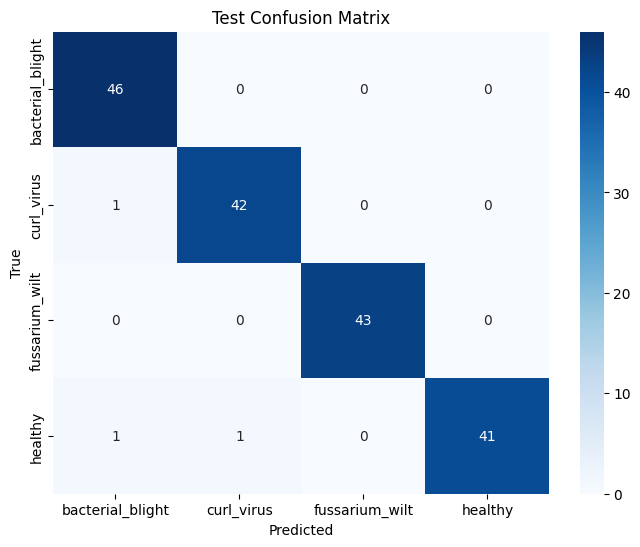


📊 ROC & PR AUC (per class):
              Class   ROC AUC    PR AUC
0  bacterial_blight  1.000000  1.000000
1        curl_virus  0.998767  0.996240
2    fussarium_wilt  1.000000  1.000000
3           healthy  0.995419  0.991237

Cohen's Kappa: 0.9771
Brier Score: 0.0073
Accuracy 95% CI: [0.9600, 1.0000]
Mean PPV (Precision): 0.9838
Mean NPV: 0.9944


In [ ]:
import os, time, psutil
import torch
from torch import nn, optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms, models
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix, cohen_kappa_score, brier_score_loss
from sklearn.metrics import roc_auc_score, average_precision_score
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225])
])

train_dataset = datasets.ImageFolder('/kaggle/working/cotton_train_aug', transform=transform)
val_dataset   = datasets.ImageFolder('/kaggle/working/cotton_split/val', transform=transform)
test_dataset  = datasets.ImageFolder('/kaggle/working/cotton_split/test', transform=transform)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader   = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader  = DataLoader(test_dataset, batch_size=32, shuffle=False)

class_names = train_dataset.classes
num_classes = len(class_names)


#  Multi-Head Self-Attention
class MultiHeadSelfAttention(nn.Module):
    def __init__(self, in_channels, num_heads=4, dropout=0.3):
        super().__init__()
        assert in_channels % num_heads == 0, f"in_channels {in_channels} not divisible by num_heads {num_heads}"
        self.mha = nn.MultiheadAttention(embed_dim=in_channels, num_heads=num_heads, dropout=dropout, batch_first=True)
        self.dropout = nn.Dropout(dropout)
        self.norm = nn.LayerNorm(in_channels)

    def forward(self, x):
        b, c, h, w = x.size()
        x_flat = x.view(b, c, h*w).permute(0,2,1)   # [B, HW, C]
        attn_out, _ = self.mha(x_flat, x_flat, x_flat)
        attn_out = self.dropout(attn_out)
        attn_out = self.norm(attn_out + x_flat)
        out = attn_out.permute(0,2,1).view(b, c, h, w)
        return out


#  SqueezeNet + MHSA
class SqueezeNet_MHSA(nn.Module):
    def __init__(self, num_classes, num_heads=4, dropout=0.3, freeze_backbone=True):
        super().__init__()
        self.backbone = models.squeezenet1_1(weights=models.SqueezeNet1_1_Weights.DEFAULT)
        if freeze_backbone:
            for p in self.backbone.parameters():
                p.requires_grad = False
        self.features = self.backbone.features
        last_channels = 512
        self.mhsa = MultiHeadSelfAttention(in_channels=last_channels, num_heads=num_heads, dropout=dropout)
        self.classifier = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Flatten(),
            nn.Dropout(dropout),
            nn.Linear(last_channels, num_classes)
        )

    def forward(self, x):
        features = self.features(x)
        attn_features = self.mhsa(features)
        out = self.classifier(attn_features)
        return out


# Instantiate model, criterion, optimizer
model = SqueezeNet_MHSA(num_classes=num_classes, num_heads=4, dropout=0.3).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4, weight_decay=1e-4)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=5)


# Training loop
num_epochs = 50
best_val_loss = float('inf')
patience_counter = 0

for epoch in range(num_epochs):
    model.train()
    running_loss, correct, total = 0, 0, 0
    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
        _, preds = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (preds == labels).sum().item()

    train_loss = running_loss / len(train_loader)
    train_acc = correct / total

    # Validation
    model.eval()
    val_loss, val_correct, val_total = 0, 0, 0
    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            val_loss += loss.item()
            _, preds = torch.max(outputs, 1)
            val_total += labels.size(0)
            val_correct += (preds == labels).sum().item()

    val_loss /= len(val_loader)
    val_acc = val_correct / val_total
    scheduler.step(val_loss)

    print(f"Epoch {epoch+1}/{num_epochs} | Train Loss: {train_loss:.4f}, Acc: {train_acc:.4f} | "
          f"Val Loss: {val_loss:.4f}, Acc: {val_acc:.4f}")

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model.state_dict(), "best_squeezenet_mhsa.pth")
        patience_counter = 0
    else:
        patience_counter += 1
        if patience_counter >= 5:
            print("Early stopping!")
            break


# Load best model
model.load_state_dict(torch.load("best_squeezenet_mhsa.pth"))
model.eval()


# Prediction helper
def get_preds(loader):
    labels_list, preds_list, probs_list = [], [], []
    with torch.no_grad():
        for inputs, labels in loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            probs = torch.softmax(outputs, dim=1)
            _, preds = torch.max(outputs, 1)
            labels_list.extend(labels.cpu().numpy())
            preds_list.extend(preds.cpu().numpy())
            probs_list.extend(probs.cpu().numpy())
    return np.array(labels_list), np.array(preds_list), np.array(probs_list)

train_labels, train_preds, train_probs = get_preds(train_loader)
val_labels, val_preds, val_probs       = get_preds(val_loader)
test_labels, test_preds, test_probs    = get_preds(test_loader)


#  Classification Reports
print("\n Train Report:\n", classification_report(train_labels, train_preds, target_names=class_names, digits=4))
print("\n Validation Report:\n", classification_report(val_labels, val_preds, target_names=class_names, digits=4))
print("\n Test Report:\n", classification_report(test_labels, test_preds, target_names=class_names, digits=4))


# Confusion Matrix
cm = confusion_matrix(test_labels, test_preds)
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted"); plt.ylabel("True"); plt.title("Test Confusion Matrix")
plt.show()


#  ROC & PR AUC
test_labels_onehot = np.eye(num_classes)[test_labels]
roc_auc_list = [roc_auc_score(test_labels_onehot[:,i], test_probs[:,i]) for i in range(num_classes)]
pr_auc_list  = [average_precision_score(test_labels_onehot[:,i], test_probs[:,i]) for i in range(num_classes)]
print("\n📊 ROC & PR AUC (per class):")
print(pd.DataFrame({"Class": class_names, "ROC AUC": roc_auc_list, "PR AUC": pr_auc_list}))


# Extra Metrics with  bootstrap + PPV/NPV
kappa = cohen_kappa_score(test_labels, test_preds)
brier = brier_score_loss(test_labels_onehot.flatten(), test_probs.flatten())

# Bootstrap Accuracy CI: sample the same indices for labels & predictions
n_samples = len(test_labels)
boot_acc = []
rng = np.random.default_rng()
for _ in range(1000):
    idx = rng.integers(0, n_samples, n_samples)
    boot_acc.append(np.mean(test_labels[idx] == test_preds[idx]))
ci_low, ci_high = np.percentile(boot_acc, [2.5, 97.5])

# Confusion matrix components
cm = confusion_matrix(test_labels, test_preds)
TP = np.diag(cm)
FP = cm.sum(axis=0) - TP
FN = cm.sum(axis=1) - TP
TN = cm.sum() - (TP + FP + FN)

PPV = TP / (TP + FP + 1e-8)  # Precision
NPV = TN / (TN + FN + 1e-8)

print(f"\nCohen's Kappa: {kappa:.4f}")
print(f"Brier Score: {brier:.4f}")
print(f"Accuracy 95% CI: [{ci_low:.4f}, {ci_high:.4f}]")
print(f"Mean PPV (Precision): {np.mean(PPV):.4f}")
print(f"Mean NPV: {np.mean(NPV):.4f}")


# ResNet101 + MHSA

Downloading: "https://download.pytorch.org/models/resnet101-cd907fc2.pth" to /root/.cache/torch/hub/checkpoints/resnet101-cd907fc2.pth
100%|██████████| 171M/171M [00:02<00:00, 77.9MB/s] 


Epoch 1/50 | Train Loss: 0.3452, Acc: 0.8726 | Val Loss: 0.1502, Acc: 0.9583
Epoch 2/50 | Train Loss: 0.1124, Acc: 0.9627 | Val Loss: 0.0925, Acc: 0.9702
Epoch 3/50 | Train Loss: 0.0703, Acc: 0.9757 | Val Loss: 0.1790, Acc: 0.9464
Epoch 4/50 | Train Loss: 0.0766, Acc: 0.9735 | Val Loss: 0.1182, Acc: 0.9821
Epoch 5/50 | Train Loss: 0.0535, Acc: 0.9821 | Val Loss: 0.0830, Acc: 0.9821
Epoch 6/50 | Train Loss: 0.0376, Acc: 0.9881 | Val Loss: 0.0685, Acc: 0.9821
Epoch 7/50 | Train Loss: 0.0572, Acc: 0.9822 | Val Loss: 0.1228, Acc: 0.9702
Epoch 8/50 | Train Loss: 0.0832, Acc: 0.9709 | Val Loss: 0.0951, Acc: 0.9821
Epoch 9/50 | Train Loss: 0.0539, Acc: 0.9821 | Val Loss: 0.1416, Acc: 0.9821
Epoch 10/50 | Train Loss: 0.0331, Acc: 0.9892 | Val Loss: 0.0955, Acc: 0.9821
Epoch 11/50 | Train Loss: 0.0334, Acc: 0.9883 | Val Loss: 0.1219, Acc: 0.9821
Early stopping!

📄 Train Report:
                   precision    recall  f1-score   support

bacterial_blight     1.0000    0.9860    0.9930      1432


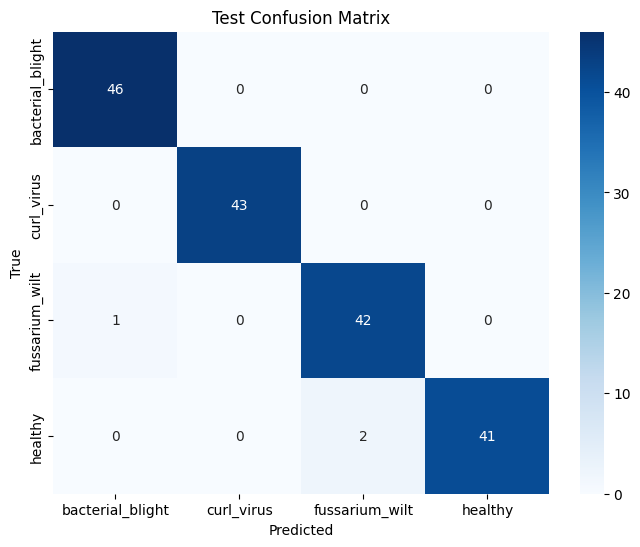


📊 ROC & PR AUC (per class):
              Class   ROC AUC    PR AUC
0  bacterial_blight  1.000000  1.000000
1        curl_virus  1.000000  1.000000
2    fussarium_wilt  0.998943  0.996788
3           healthy  0.996300  0.992369

Cohen's Kappa: 0.9771
Brier Score: 0.0075
Accuracy 95% CI: [0.9600, 1.0000]
Mean PPV (Precision): 0.9833
Mean NPV: 0.9944


In [ ]:
import os, time, psutil
import torch
from torch import nn, optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms, models
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix, cohen_kappa_score, brier_score_loss
from sklearn.metrics import roc_auc_score, average_precision_score
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225])
])

train_dataset = datasets.ImageFolder('/kaggle/working/cotton_train_aug', transform=transform)
val_dataset   = datasets.ImageFolder('/kaggle/working/cotton_split/val', transform=transform)
test_dataset  = datasets.ImageFolder('/kaggle/working/cotton_split/test', transform=transform)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader   = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader  = DataLoader(test_dataset, batch_size=32, shuffle=False)

class_names = train_dataset.classes
num_classes = len(class_names)


# Multi-Head Self-Attention
class MultiHeadSelfAttention(nn.Module):
    def __init__(self, in_channels, num_heads=4, dropout=0.3):
        super().__init__()
        assert in_channels % num_heads == 0, f"in_channels {in_channels} not divisible by num_heads {num_heads}"
        self.mha = nn.MultiheadAttention(embed_dim=in_channels, num_heads=num_heads, dropout=dropout, batch_first=True)
        self.dropout = nn.Dropout(dropout)
        self.norm = nn.LayerNorm(in_channels)

    def forward(self, x):
        b, c, h, w = x.size()
        x_flat = x.view(b, c, h*w).permute(0,2,1)   # [B, HW, C]
        attn_out, _ = self.mha(x_flat, x_flat, x_flat)
        attn_out = self.dropout(attn_out)
        attn_out = self.norm(attn_out + x_flat)
        out = attn_out.permute(0,2,1).view(b, c, h, w)
        return out


#  ResNet101 + MHSA
class ResNet101_MHSA(nn.Module):
    def __init__(self, num_classes, num_heads=4, dropout=0.3, freeze_backbone=True):
        super().__init__()
        self.backbone = models.resnet101(weights=models.ResNet101_Weights.DEFAULT)
        if freeze_backbone:
            for p in self.backbone.parameters():
                p.requires_grad = False
     
        self.backbone.fc = nn.Identity()
        last_channels = self.backbone.fc.in_features if hasattr(self.backbone.fc, 'in_features') else 2048
        self.mhsa = MultiHeadSelfAttention(in_channels=2048, num_heads=num_heads, dropout=dropout)
        self.classifier = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Flatten(),
            nn.Dropout(dropout),
            nn.Linear(2048, num_classes)
        )

    def forward(self, x):
        features = self.backbone(x).unsqueeze(-1).unsqueeze(-1)  # [B, 2048, 1, 1] if needed
        attn_features = self.mhsa(features)
        out = self.classifier(attn_features)
        return out

#  Instantiate model, criterion, optimizer
model = ResNet101_MHSA(num_classes=num_classes, num_heads=4, dropout=0.3).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4, weight_decay=1e-4)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=5)

# Training loop
num_epochs = 50
best_val_loss = float('inf')
patience_counter = 0

for epoch in range(num_epochs):
    model.train()
    running_loss, correct, total = 0, 0, 0
    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
        _, preds = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (preds == labels).sum().item()

    train_loss = running_loss / len(train_loader)
    train_acc = correct / total

    # Validation
    model.eval()
    val_loss, val_correct, val_total = 0, 0, 0
    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            val_loss += loss.item()
            _, preds = torch.max(outputs, 1)
            val_total += labels.size(0)
            val_correct += (preds == labels).sum().item()

    val_loss /= len(val_loader)
    val_acc = val_correct / val_total
    scheduler.step(val_loss)

    print(f"Epoch {epoch+1}/{num_epochs} | Train Loss: {train_loss:.4f}, Acc: {train_acc:.4f} | "
          f"Val Loss: {val_loss:.4f}, Acc: {val_acc:.4f}")

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model.state_dict(), "best_resnet101_mhsa.pth")
        patience_counter = 0
    else:
        patience_counter += 1
        if patience_counter >= 5:
            print("Early stopping!")
            break


#  Load best model
model.load_state_dict(torch.load("best_resnet101_mhsa.pth"))
model.eval()


#  Prediction helper
def get_preds(loader):
    labels_list, preds_list, probs_list = [], [], []
    with torch.no_grad():
        for inputs, labels in loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            probs = torch.softmax(outputs, dim=1)
            _, preds = torch.max(outputs, 1)
            labels_list.extend(labels.cpu().numpy())
            preds_list.extend(preds.cpu().numpy())
            probs_list.extend(probs.cpu().numpy())
    return np.array(labels_list), np.array(preds_list), np.array(probs_list)

train_labels, train_preds, train_probs = get_preds(train_loader)
val_labels, val_preds, val_probs       = get_preds(val_loader)
test_labels, test_preds, test_probs    = get_preds(test_loader)


#  Classification Reports
print("\n📄 Train Report:\n", classification_report(train_labels, train_preds, target_names=class_names, digits=4))
print("\n📄 Validation Report:\n", classification_report(val_labels, val_preds, target_names=class_names, digits=4))
print("\n📄 Test Report:\n", classification_report(test_labels, test_preds, target_names=class_names, digits=4))


#  Confusion Matrix
cm = confusion_matrix(test_labels, test_preds)
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted"); plt.ylabel("True"); plt.title("Test Confusion Matrix")
plt.show()


#  ROC & PR AUC
test_labels_onehot = np.eye(num_classes)[test_labels]
roc_auc_list = [roc_auc_score(test_labels_onehot[:,i], test_probs[:,i]) for i in range(num_classes)]
pr_auc_list  = [average_precision_score(test_labels_onehot[:,i], test_probs[:,i]) for i in range(num_classes)]
print("\n📊 ROC & PR AUC (per class):")
print(pd.DataFrame({"Class": class_names, "ROC AUC": roc_auc_list, "PR AUC": pr_auc_list}))


#  Extra Metrics with PPV/NPV
kappa = cohen_kappa_score(test_labels, test_preds)
brier = brier_score_loss(test_labels_onehot.flatten(), test_probs.flatten())

# Bootstrap Accuracy CI
n_samples = len(test_labels)
boot_acc = []
rng = np.random.default_rng()
for _ in range(1000):
    idx = rng.integers(0, n_samples, n_samples)
    boot_acc.append(np.mean(test_labels[idx] == test_preds[idx]))
ci_low, ci_high = np.percentile(boot_acc, [2.5, 97.5])

# Confusion matrix components
TP = np.diag(cm)
FP = cm.sum(axis=0) - TP
FN = cm.sum(axis=1) - TP
TN = cm.sum() - (TP + FP + FN)

PPV = TP / (TP + FP + 1e-8)
NPV = TN / (TN + FN + 1e-8)

print(f"\nCohen's Kappa: {kappa:.4f}")
print(f"Brier Score: {brier:.4f}")
print(f"Accuracy 95% CI: [{ci_low:.4f}, {ci_high:.4f}]")
print(f"Mean PPV (Precision): {np.mean(PPV):.4f}")
print(f"Mean NPV: {np.mean(NPV):.4f}")


# MobileNetV2 + MHSA

Downloading: "https://download.pytorch.org/models/mobilenet_v2-7ebf99e0.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-7ebf99e0.pth
100%|██████████| 13.6M/13.6M [00:00<00:00, 97.5MB/s]


Epoch 1/50 | Train Loss: 0.3011, Acc: 0.9008 | Val Loss: 0.1111, Acc: 0.9702
Epoch 2/50 | Train Loss: 0.0767, Acc: 0.9771 | Val Loss: 0.0805, Acc: 0.9762
Epoch 3/50 | Train Loss: 0.0530, Acc: 0.9830 | Val Loss: 0.0634, Acc: 0.9821
Epoch 4/50 | Train Loss: 0.0384, Acc: 0.9870 | Val Loss: 0.0847, Acc: 0.9821
Epoch 5/50 | Train Loss: 0.0270, Acc: 0.9899 | Val Loss: 0.0573, Acc: 0.9821
Epoch 6/50 | Train Loss: 0.0223, Acc: 0.9940 | Val Loss: 0.0605, Acc: 0.9821
Epoch 7/50 | Train Loss: 0.0124, Acc: 0.9965 | Val Loss: 0.0785, Acc: 0.9821
Epoch 8/50 | Train Loss: 0.0160, Acc: 0.9945 | Val Loss: 0.0844, Acc: 0.9881
Epoch 9/50 | Train Loss: 0.0163, Acc: 0.9941 | Val Loss: 0.0957, Acc: 0.9821
Epoch 10/50 | Train Loss: 0.0114, Acc: 0.9973 | Val Loss: 0.0754, Acc: 0.9821
Early stopping!

📄 Train Report:
                   precision    recall  f1-score   support

bacterial_blight     1.0000    0.9993    0.9997      1432
      curl_virus     1.0000    0.9985    0.9992      1332
  fussarium_wilt    

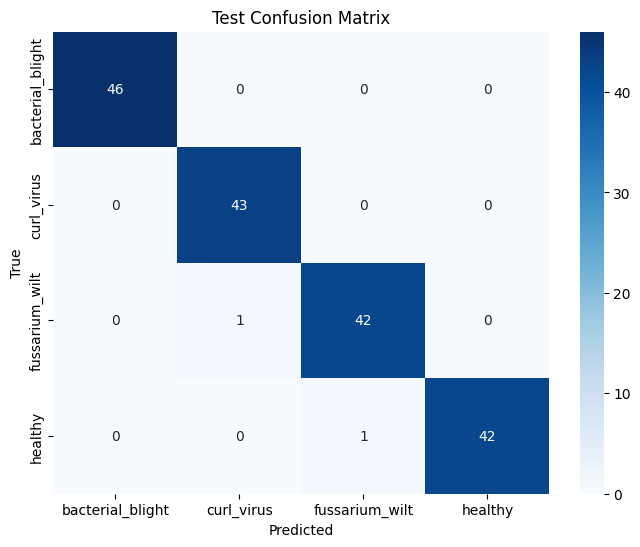


📊 ROC & PR AUC (per class):
              Class   ROC AUC    PR AUC
0  bacterial_blight  1.000000  1.000000
1        curl_virus  1.000000  1.000000
2    fussarium_wilt  0.998062  0.993397
3           healthy  0.994891  0.990633

Cohen's Kappa: 0.9848
Brier Score: 0.0046
Accuracy 95% CI: [0.9714, 1.0000]
Mean PPV (Precision): 0.9885
Mean NPV: 0.9962


In [ ]:
import os, time, psutil
import torch
from torch import nn, optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms, models
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix, cohen_kappa_score, brier_score_loss
from sklearn.metrics import roc_auc_score, average_precision_score
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225])
])

train_dataset = datasets.ImageFolder('/kaggle/working/cotton_train_aug', transform=transform)
val_dataset   = datasets.ImageFolder('/kaggle/working/cotton_split/val', transform=transform)
test_dataset  = datasets.ImageFolder('/kaggle/working/cotton_split/test', transform=transform)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader   = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader  = DataLoader(test_dataset, batch_size=32, shuffle=False)

class_names = train_dataset.classes
num_classes = len(class_names)


#  Multi-Head Self-Attention
class MultiHeadSelfAttention(nn.Module):
    def __init__(self, in_channels, num_heads=4, dropout=0.3):
        super().__init__()
        assert in_channels % num_heads == 0, f"in_channels {in_channels} not divisible by num_heads {num_heads}"
        self.mha = nn.MultiheadAttention(embed_dim=in_channels, num_heads=num_heads, dropout=dropout, batch_first=True)
        self.dropout = nn.Dropout(dropout)
        self.norm = nn.LayerNorm(in_channels)

    def forward(self, x):
        b, c, h, w = x.size()
        x_flat = x.view(b, c, h*w).permute(0,2,1)   # [B, HW, C]
        attn_out, _ = self.mha(x_flat, x_flat, x_flat)
        attn_out = self.dropout(attn_out)
        attn_out = self.norm(attn_out + x_flat)
        out = attn_out.permute(0,2,1).view(b, c, h, w)
        return out


#  MobileNetV2 + MHSA
class MobileNetV2_MHSA(nn.Module):
    def __init__(self, num_classes, num_heads=4, dropout=0.3, freeze_backbone=True):
        super().__init__()
        self.backbone = models.mobilenet_v2(weights=models.MobileNet_V2_Weights.DEFAULT)
        if freeze_backbone:
            for p in self.backbone.parameters():
                p.requires_grad = False
     
        self.features = self.backbone.features
        last_channels = 1280  
        self.mhsa = MultiHeadSelfAttention(in_channels=last_channels, num_heads=num_heads, dropout=dropout)
        self.classifier = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Flatten(),
            nn.Dropout(dropout),
            nn.Linear(last_channels, num_classes)
        )

    def forward(self, x):
        features = self.features(x)        # [B, 1280, H, W]
        attn_features = self.mhsa(features)
        out = self.classifier(attn_features)
        return out


#  Instantiate model, criterion, optimizer
model = MobileNetV2_MHSA(num_classes=num_classes, num_heads=4, dropout=0.3).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4, weight_decay=1e-4)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=5)


#  Training loop
num_epochs = 50
best_val_loss = float('inf')
patience_counter = 0

for epoch in range(num_epochs):
    model.train()
    running_loss, correct, total = 0, 0, 0
    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
        _, preds = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (preds == labels).sum().item()

    train_loss = running_loss / len(train_loader)
    train_acc = correct / total

    # Validation
    model.eval()
    val_loss, val_correct, val_total = 0, 0, 0
    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            val_loss += loss.item()
            _, preds = torch.max(outputs, 1)
            val_total += labels.size(0)
            val_correct += (preds == labels).sum().item()

    val_loss /= len(val_loader)
    val_acc = val_correct / val_total
    scheduler.step(val_loss)

    print(f"Epoch {epoch+1}/{num_epochs} | Train Loss: {train_loss:.4f}, Acc: {train_acc:.4f} | "
          f"Val Loss: {val_loss:.4f}, Acc: {val_acc:.4f}")

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model.state_dict(), "best_mobilenetv2_mhsa.pth")
        patience_counter = 0
    else:
        patience_counter += 1
        if patience_counter >= 5:
            print("Early stopping!")
            break


#  Load best model
model.load_state_dict(torch.load("best_mobilenetv2_mhsa.pth"))
model.eval()


#  Prediction helper
def get_preds(loader):
    labels_list, preds_list, probs_list = [], [], []
    with torch.no_grad():
        for inputs, labels in loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            probs = torch.softmax(outputs, dim=1)
            _, preds = torch.max(outputs, 1)
            labels_list.extend(labels.cpu().numpy())
            preds_list.extend(preds.cpu().numpy())
            probs_list.extend(probs.cpu().numpy())
    return np.array(labels_list), np.array(preds_list), np.array(probs_list)

train_labels, train_preds, train_probs = get_preds(train_loader)
val_labels, val_preds, val_probs       = get_preds(val_loader)
test_labels, test_preds, test_probs    = get_preds(test_loader)


#  Classification Reports
print("\n📄 Train Report:\n", classification_report(train_labels, train_preds, target_names=class_names, digits=4))
print("\n📄 Validation Report:\n", classification_report(val_labels, val_preds, target_names=class_names, digits=4))
print("\n📄 Test Report:\n", classification_report(test_labels, test_preds, target_names=class_names, digits=4))


#  Confusion Matrix
cm = confusion_matrix(test_labels, test_preds)
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted"); plt.ylabel("True"); plt.title("Test Confusion Matrix")
plt.show()


#  ROC & PR AUC
test_labels_onehot = np.eye(num_classes)[test_labels]
roc_auc_list = [roc_auc_score(test_labels_onehot[:,i], test_probs[:,i]) for i in range(num_classes)]
pr_auc_list  = [average_precision_score(test_labels_onehot[:,i], test_probs[:,i]) for i in range(num_classes)]
print("\n📊 ROC & PR AUC (per class):")
print(pd.DataFrame({"Class": class_names, "ROC AUC": roc_auc_list, "PR AUC": pr_auc_list}))


#  Extra Metrics with PPV/NPV
kappa = cohen_kappa_score(test_labels, test_preds)
brier = brier_score_loss(test_labels_onehot.flatten(), test_probs.flatten())

# Bootstrap Accuracy CI
n_samples = len(test_labels)
boot_acc = []
rng = np.random.default_rng()
for _ in range(1000):
    idx = rng.integers(0, n_samples, n_samples)
    boot_acc.append(np.mean(test_labels[idx] == test_preds[idx]))
ci_low, ci_high = np.percentile(boot_acc, [2.5, 97.5])

# Confusion matrix components
TP = np.diag(cm)
FP = cm.sum(axis=0) - TP
FN = cm.sum(axis=1) - TP
TN = cm.sum() - (TP + FP + FN)

PPV = TP / (TP + FP + 1e-8)
NPV = TN / (TN + FN + 1e-8)

print(f"\nCohen's Kappa: {kappa:.4f}")
print(f"Brier Score: {brier:.4f}")
print(f"Accuracy 95% CI: [{ci_low:.4f}, {ci_high:.4f}]")
print(f"Mean PPV (Precision): {np.mean(PPV):.4f}")
print(f"Mean NPV: {np.mean(NPV):.4f}")


# EfficientNet-B0 + MHSA

Epoch 1/50 | Train Loss: 0.3866, Acc: 0.8726 | Val Loss: 0.0732, Acc: 0.9702
Epoch 2/50 | Train Loss: 0.0948, Acc: 0.9725 | Val Loss: 0.0325, Acc: 0.9940
Epoch 3/50 | Train Loss: 0.0546, Acc: 0.9837 | Val Loss: 0.0311, Acc: 0.9881
Epoch 4/50 | Train Loss: 0.0395, Acc: 0.9887 | Val Loss: 0.0254, Acc: 0.9940
Epoch 5/50 | Train Loss: 0.0224, Acc: 0.9941 | Val Loss: 0.0255, Acc: 0.9940
Epoch 6/50 | Train Loss: 0.0273, Acc: 0.9907 | Val Loss: 0.0200, Acc: 0.9881
Epoch 7/50 | Train Loss: 0.0216, Acc: 0.9938 | Val Loss: 0.0110, Acc: 0.9940
Epoch 8/50 | Train Loss: 0.0134, Acc: 0.9971 | Val Loss: 0.0210, Acc: 0.9940
Epoch 9/50 | Train Loss: 0.0164, Acc: 0.9958 | Val Loss: 0.0140, Acc: 0.9940
Epoch 10/50 | Train Loss: 0.0132, Acc: 0.9967 | Val Loss: 0.0213, Acc: 0.9940
Epoch 11/50 | Train Loss: 0.0102, Acc: 0.9974 | Val Loss: 0.0076, Acc: 0.9940
Epoch 12/50 | Train Loss: 0.0101, Acc: 0.9973 | Val Loss: 0.0233, Acc: 0.9940
Epoch 13/50 | Train Loss: 0.0116, Acc: 0.9973 | Val Loss: 0.0174, Acc: 0.

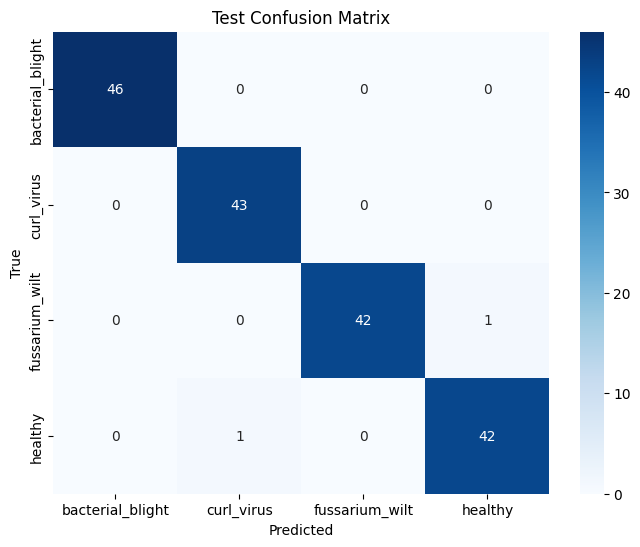


📊 ROC & PR AUC (per class):
              Class   ROC AUC    PR AUC
0  bacterial_blight  1.000000  1.000000
1        curl_virus  0.999119  0.997228
2    fussarium_wilt  1.000000  1.000000
3           healthy  0.985377  0.984681

Cohen's Kappa: 0.9848
Brier Score: 0.0041
Accuracy 95% CI: [0.9714, 1.0000]
Mean PPV (Precision): 0.9885
Mean NPV: 0.9962


In [ ]:
import os, time, psutil
import torch
from torch import nn, optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms, models
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix, cohen_kappa_score, brier_score_loss
from sklearn.metrics import roc_auc_score, average_precision_score
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225])
])

train_dataset = datasets.ImageFolder('/kaggle/working/cotton_train_aug', transform=transform)
val_dataset   = datasets.ImageFolder('/kaggle/working/cotton_split/val', transform=transform)
test_dataset  = datasets.ImageFolder('/kaggle/working/cotton_split/test', transform=transform)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader   = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader  = DataLoader(test_dataset, batch_size=32, shuffle=False)

class_names = train_dataset.classes
num_classes = len(class_names)


#  Multi-Head Self-Attention

class MultiHeadSelfAttention(nn.Module):
    def __init__(self, in_channels, num_heads=4, dropout=0.6):  # dropout = 0.6
        super().__init__()
        assert in_channels % num_heads == 0, f"in_channels {in_channels} not divisible by num_heads {num_heads}"
        self.mha = nn.MultiheadAttention(embed_dim=in_channels, num_heads=num_heads, dropout=dropout, batch_first=True)
        self.dropout = nn.Dropout(dropout)
        self.norm = nn.LayerNorm(in_channels)

    def forward(self, x):
        b, c, h, w = x.size()
        x_flat = x.view(b, c, h*w).permute(0,2,1)   # [B, HW, C]
        attn_out, _ = self.mha(x_flat, x_flat, x_flat)
        attn_out = self.dropout(attn_out)
        attn_out = self.norm(attn_out + x_flat)
        out = attn_out.permute(0,2,1).view(b, c, h, w)
        return out

#  EfficientNet-B0 + MHSA
class EfficientNetB0_MHSA(nn.Module):
    def __init__(self, num_classes, num_heads=4, dropout=0.6, freeze_backbone=True):  # dropout = 0.6
        super().__init__()
        self.backbone = models.efficientnet_b0(weights=models.EfficientNet_B0_Weights.DEFAULT)
        if freeze_backbone:
            for p in self.backbone.parameters():
                p.requires_grad = False
        self.features = self.backbone.features
        last_channels = 1280
        self.mhsa = MultiHeadSelfAttention(in_channels=last_channels, num_heads=num_heads, dropout=dropout)
        self.classifier = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Flatten(),
            nn.Dropout(dropout),          # dropout = 0.6
            nn.Linear(last_channels, num_classes)
        )

    def forward(self, x):
        features = self.features(x)
        attn_features = self.mhsa(features)
        out = self.classifier(attn_features)
        return out


# Instantiate model, criterion, optimizer
model = EfficientNetB0_MHSA(num_classes=num_classes, num_heads=4, dropout=0.3).to(device)  # dropout = 0.3
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4, weight_decay=1e-4)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=5)  # patience = 5


# Training loop
num_epochs = 50
best_val_loss = float('inf')
patience_counter = 0

for epoch in range(num_epochs):
    model.train()
    running_loss, correct, total = 0, 0, 0
    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
        _, preds = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (preds == labels).sum().item()

    train_loss = running_loss / len(train_loader)
    train_acc = correct / total

    # Validation
    model.eval()
    val_loss, val_correct, val_total = 0, 0, 0
    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            val_loss += loss.item()
            _, preds = torch.max(outputs, 1)
            val_total += labels.size(0)
            val_correct += (preds == labels).sum().item()

    val_loss /= len(val_loader)
    val_acc = val_correct / val_total
    scheduler.step(val_loss)

    print(f"Epoch {epoch+1}/{num_epochs} | Train Loss: {train_loss:.4f}, Acc: {train_acc:.4f} | "
          f"Val Loss: {val_loss:.4f}, Acc: {val_acc:.4f}")

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model.state_dict(), "best_efficientnetb0_mhsa.pth")
        patience_counter = 0
    else:
        patience_counter += 1
        if patience_counter >= 5:   
            print("Early stopping!")
            break


# Load best model
model.load_state_dict(torch.load("best_efficientnetb0_mhsa.pth"))
model.eval()


#  Prediction helper
def get_preds(loader):
    labels_list, preds_list, probs_list = [], [], []
    with torch.no_grad():
        for inputs, labels in loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            probs = torch.softmax(outputs, dim=1)
            _, preds = torch.max(outputs, 1)
            labels_list.extend(labels.cpu().numpy())
            preds_list.extend(preds.cpu().numpy())
            probs_list.extend(probs.cpu().numpy())
    return np.array(labels_list), np.array(preds_list), np.array(probs_list)

train_labels, train_preds, train_probs = get_preds(train_loader)
val_labels, val_preds, val_probs       = get_preds(val_loader)
test_labels, test_preds, test_probs    = get_preds(test_loader)


#  Classification Reports
print("\n📄 Train Report:\n", classification_report(train_labels, train_preds, target_names=class_names, digits=4))
print("\n📄 Validation Report:\n", classification_report(val_labels, val_preds, target_names=class_names, digits=4))
print("\n📄 Test Report:\n", classification_report(test_labels, test_preds, target_names=class_names, digits=4))


#  Confusion Matrix
cm = confusion_matrix(test_labels, test_preds)
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted"); plt.ylabel("True"); plt.title("Test Confusion Matrix")
plt.show()


#  ROC & PR AUC
test_labels_onehot = np.eye(num_classes)[test_labels]
roc_auc_list = [roc_auc_score(test_labels_onehot[:,i], test_probs[:,i]) for i in range(num_classes)]
pr_auc_list  = [average_precision_score(test_labels_onehot[:,i], test_probs[:,i]) for i in range(num_classes)]
print("\n📊 ROC & PR AUC (per class):")
print(pd.DataFrame({"Class": class_names, "ROC AUC": roc_auc_list, "PR AUC": pr_auc_list}))


#  Extra Metrics with PPV/NPV
kappa = cohen_kappa_score(test_labels, test_preds)
brier = brier_score_loss(test_labels_onehot.flatten(), test_probs.flatten())

# Bootstrap Accuracy CI 
n_samples = len(test_labels)
boot_acc = []
rng = np.random.default_rng()
for _ in range(1000):
    idx = rng.integers(0, n_samples, n_samples)
    boot_acc.append(np.mean(test_labels[idx] == test_preds[idx]))
ci_low, ci_high = np.percentile(boot_acc, [2.5, 97.5])

# Confusion matrix components
TP = np.diag(cm)
FP = cm.sum(axis=0) - TP
FN = cm.sum(axis=1) - TP
TN = cm.sum() - (TP + FP + FN)

PPV = TP / (TP + FP + 1e-8)
NPV = TN / (TN + FN + 1e-8)

print(f"\nCohen's Kappa: {kappa:.4f}")
print(f"Brier Score: {brier:.4f}")
print(f"Accuracy 95% CI: [{ci_low:.4f}, {ci_high:.4f}]")
print(f"Mean PPV (Precision): {np.mean(PPV):.4f}")
print(f"Mean NPV: {np.mean(NPV):.4f}")


# ShuffleNetV2 + MHSA Model

Epoch 1/50 | Train Loss: 0.4528, Acc: 0.8335 | Val Loss: 0.0821, Acc: 0.9881
Epoch 2/50 | Train Loss: 0.1530, Acc: 0.9469 | Val Loss: 0.0613, Acc: 0.9881
Epoch 3/50 | Train Loss: 0.1035, Acc: 0.9674 | Val Loss: 0.0652, Acc: 0.9881
Epoch 4/50 | Train Loss: 0.0909, Acc: 0.9689 | Val Loss: 0.0601, Acc: 0.9881
Epoch 5/50 | Train Loss: 0.0761, Acc: 0.9740 | Val Loss: 0.0624, Acc: 0.9643
Epoch 6/50 | Train Loss: 0.0582, Acc: 0.9810 | Val Loss: 0.0548, Acc: 0.9881
Epoch 7/50 | Train Loss: 0.0712, Acc: 0.9749 | Val Loss: 0.0458, Acc: 0.9881
Epoch 8/50 | Train Loss: 0.0581, Acc: 0.9824 | Val Loss: 0.0801, Acc: 0.9881
Epoch 9/50 | Train Loss: 0.0579, Acc: 0.9797 | Val Loss: 0.0595, Acc: 0.9881
Epoch 10/50 | Train Loss: 0.0601, Acc: 0.9780 | Val Loss: 0.0714, Acc: 0.9881
Early stopping triggered

✅ Training complete. Total time: 123.00s

📄 Train Classification Report:
                  precision    recall  f1-score   support

bacterial_blight     1.0000    0.9993    0.9997      1432
      curl_vi

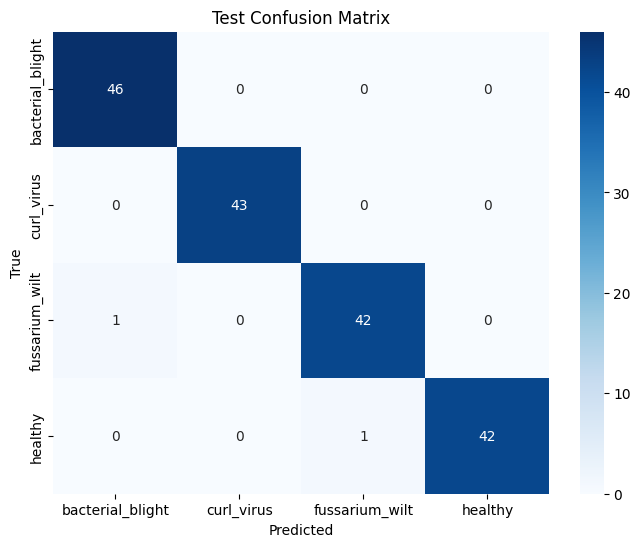


📊 Class-wise ROC AUC & PR AUC (Test):
              Class ROC AUC  PR AUC
0  bacterial_blight  1.0000  1.0000
1        curl_virus  1.0000  1.0000
2    fussarium_wilt  0.9991  0.9972
3           healthy  0.9938  0.9896
Inference time: 0.386s | Per sample: 0.0022s | GPU Mem: 305.12MB | RAM: 2603.11MB

Cohen's Kappa: 0.9848
Brier Score: 0.0059
Accuracy: 0.9886
Accuracy 95% CI (bootstrap): [0.9714, 1.0000]
Accuracy 95% CI (Wilson):    [0.9593, 0.9969]
Mean PPV: 0.9889 | Mean NPV: 0.9962


In [ ]:
import os, time, psutil, random
import torch
from torch import nn, optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms, models
import numpy as np
from sklearn.metrics import (
    classification_report, confusion_matrix, cohen_kappa_score, brier_score_loss,
    roc_auc_score, average_precision_score
)
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd


SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225])
])

train_dataset = datasets.ImageFolder('/kaggle/working/cotton_train_aug', transform=transform)
val_dataset   = datasets.ImageFolder('/kaggle/working/cotton_split/val', transform=transform)
test_dataset  = datasets.ImageFolder('/kaggle/working/cotton_split/test', transform=transform)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader   = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader  = DataLoader(test_dataset, batch_size=32, shuffle=False)

class_names = train_dataset.classes
num_classes = len(class_names)


# Multi-Head Self-Attention
class MultiHeadSelfAttention(nn.Module):
    def __init__(self, in_channels, num_heads=4, dropout=0.3):
        super().__init__()
        assert in_channels % num_heads == 0, f"in_channels ({in_channels}) must be divisible by num_heads ({num_heads})"
        self.mha = nn.MultiheadAttention(embed_dim=in_channels, num_heads=num_heads, dropout=dropout, batch_first=True)
        self.dropout = nn.Dropout(dropout)
        self.norm = nn.LayerNorm(in_channels)

    def forward(self, x):
        b, c, h, w = x.size()
        x_flat = x.view(b, c, h*w).permute(0,2,1)  # [B, HW, C]
        attn_out, _ = self.mha(x_flat, x_flat, x_flat)
        attn_out = self.dropout(attn_out)
        attn_out = self.norm(attn_out + x_flat)
        out = attn_out.permute(0,2,1).view(b, c, h, w)
        return out


#  ShuffleNetV2 + MHSA Model
class ShuffleNetV2_MHSA(nn.Module):
    def __init__(self, num_classes, num_heads=4, dropout=0.3, freeze_backbone=True):
        super().__init__()
        self.backbone = models.shufflenet_v2_x1_0(weights=models.ShuffleNet_V2_X1_0_Weights.DEFAULT)
        if freeze_backbone:
            for p in self.backbone.parameters():
                p.requires_grad = False
        self.backbone.fc = nn.Identity()
        self.mhsa = MultiHeadSelfAttention(in_channels=1024, num_heads=num_heads, dropout=dropout)
        self.classifier = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Flatten(),
            nn.Dropout(dropout),
            nn.Linear(1024, num_classes)
        )

    def forward(self, x):
        feats = self.backbone(x)                    # [B, 1024]
        feats = feats.unsqueeze(-1).unsqueeze(-1)   # [B, 1024, 1, 1]
        attn_feats = self.mhsa(feats)
        out = self.classifier(attn_feats)
        return out


#  Instantiate model, criterion, optimizer
model = ShuffleNetV2_MHSA(num_classes=num_classes, num_heads=4, dropout=0.3).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4, weight_decay=1e-4)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=5)  # ← patience=5


#  Training loop
num_epochs = 50
best_val_loss = float('inf')
patience_counter = 0
train_start_time = time.time()

for epoch in range(num_epochs):
    model.train()
    running_loss, correct, total = 0.0, 0, 0
    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        _, preds = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (preds == labels).sum().item()

    train_loss = running_loss / len(train_loader)
    train_acc = correct / total

    # Validation
    model.eval()
    val_loss, val_correct, val_total = 0.0, 0, 0
    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            val_loss += loss.item()
            _, preds = torch.max(outputs, 1)
            val_total += labels.size(0)
            val_correct += (preds == labels).sum().item()

    val_loss /= len(val_loader)
    val_acc = val_correct / val_total
    scheduler.step(val_loss)

    print(f"Epoch {epoch+1}/{num_epochs} | Train Loss: {train_loss:.4f}, Acc: {train_acc:.4f} | "
          f"Val Loss: {val_loss:.4f}, Acc: {val_acc:.4f}")

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model.state_dict(), 'best_shufflenetv2_mhsa.pth')
        patience_counter = 0
    else:
        patience_counter += 1
        if patience_counter >= 5:   # ← patience=5
            print("Early stopping triggered")
            break

train_time = time.time() - train_start_time
print(f"\n Training complete. Total time: {train_time:.2f}s")


model.load_state_dict(torch.load('best_shufflenetv2_mhsa.pth', map_location=device))
model.eval()


#  Prediction helper
def get_preds(loader):
    labels_list, preds_list, probs_list = [], [], []
    with torch.no_grad():
        for inputs, labels in loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            probs = torch.softmax(outputs, dim=1)
            _, preds = torch.max(outputs, 1)
            labels_list.extend(labels.cpu().numpy())
            preds_list.extend(preds.cpu().numpy())
            probs_list.extend(probs.cpu().numpy())
    return np.array(labels_list), np.array(preds_list), np.array(probs_list)

train_labels, train_preds, train_probs = get_preds(train_loader)
val_labels, val_preds, val_probs       = get_preds(val_loader)
test_labels, test_preds, test_probs    = get_preds(test_loader)


# Classification Reports
print("\n📄 Train Classification Report:")
print(classification_report(train_labels, train_preds, target_names=class_names, digits=4))
print("\n📄 Validation Classification Report:")
print(classification_report(val_labels, val_preds, target_names=class_names, digits=4))
print("\n📄 Test Classification Report:")
print(classification_report(test_labels, test_preds, target_names=class_names, digits=4))


#  Confusion Matrix
cm = confusion_matrix(test_labels, test_preds)
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', xticklabels=class_names, yticklabels=class_names, cmap='Blues')
plt.xlabel("Predicted"); plt.ylabel("True"); plt.title("Test Confusion Matrix")
plt.show()


#  ROC & PR AUC
test_labels_onehot = np.eye(num_classes)[test_labels]
roc_auc_list = [roc_auc_score(test_labels_onehot[:, i], test_probs[:, i]) for i in range(num_classes)]
pr_auc_list  = [average_precision_score(test_labels_onehot[:, i], test_probs[:, i]) for i in range(num_classes)]
auc_df = pd.DataFrame({
    "Class": class_names,
    "ROC AUC": [f"{x:.4f}" for x in roc_auc_list],
    "PR AUC":  [f"{x:.4f}" for x in pr_auc_list]
})
print("\n📊 Class-wise ROC AUC & PR AUC (Test):")
print(auc_df)


#  Inference time & memory
start_inf = time.time(); _ = get_preds(test_loader)
inf_time = time.time()-start_inf
inf_time_per_sample = inf_time / len(test_dataset)
mem_usage = torch.cuda.memory_allocated()/1024**2 if torch.cuda.is_available() else 0
ram_usage = psutil.virtual_memory().used/1024**2
print(f"Inference time: {inf_time:.3f}s | Per sample: {inf_time_per_sample:.4f}s | GPU Mem: {mem_usage:.2f}MB | RAM: {ram_usage:.2f}MB")


#  Metrics: Kappa, Brier, PPV/NPV, Accuracy CI 
kappa = cohen_kappa_score(test_labels, test_preds)
brier = brier_score_loss(test_labels_onehot.flatten(), test_probs.flatten())

acc = np.mean(test_labels == test_preds)
n = len(test_labels)
rng = np.random.default_rng(SEED)
boot_acc = []
for _ in range(1000):
    idx = rng.integers(0, n, n)
    boot_acc.append(np.mean(test_labels[idx] == test_preds[idx]))
ci_low, ci_high = np.percentile(boot_acc, [2.5, 97.5])

z = 1.96
den = 1 + z**2 / n
center = (acc + z**2 / (2*n)) / den
margin = (z * np.sqrt(acc*(1-acc)/n + z**2/(4*n**2))) / den
wilson_low, wilson_high = center - margin, center + margin

TP = np.diag(cm)
FP = cm.sum(axis=0) - TP
FN = cm.sum(axis=1) - TP
TN = cm.sum() - (TP + FP + FN)
PPV = TP / (TP + FP + 1e-8)
NPV = TN / (TN + FN + 1e-8)

print(f"\nCohen's Kappa: {kappa:.4f}")
print(f"Brier Score: {brier:.4f}")
print(f"Accuracy: {acc:.4f}")
print(f"Accuracy 95% CI (bootstrap): [{ci_low:.4f}, {ci_high:.4f}]")
print(f"Accuracy 95% CI (Wilson):    [{wilson_low:.4f}, {wilson_high:.4f}]")
print(f"Mean PPV: {np.mean(PPV):.4f} | Mean NPV: {np.mean(NPV):.4f}")

# ENSEMBLE PREDICTION

[Model 1] Epoch 1/50 | Train Loss: 0.7021, Acc: 0.7549 | Val Loss: 0.2103, Acc: 0.9286
[Model 1] Epoch 2/50 | Train Loss: 0.2449, Acc: 0.9270 | Val Loss: 0.0783, Acc: 0.9702
[Model 1] Epoch 3/50 | Train Loss: 0.1279, Acc: 0.9645 | Val Loss: 0.0381, Acc: 0.9881
[Model 1] Epoch 4/50 | Train Loss: 0.0843, Acc: 0.9775 | Val Loss: 0.0335, Acc: 0.9881
[Model 1] Epoch 5/50 | Train Loss: 0.0565, Acc: 0.9874 | Val Loss: 0.0265, Acc: 0.9881
[Model 1] Epoch 6/50 | Train Loss: 0.0386, Acc: 0.9912 | Val Loss: 0.0153, Acc: 1.0000
[Model 1] Epoch 7/50 | Train Loss: 0.0301, Acc: 0.9934 | Val Loss: 0.0104, Acc: 1.0000
[Model 1] Epoch 8/50 | Train Loss: 0.0245, Acc: 0.9952 | Val Loss: 0.0073, Acc: 1.0000
[Model 1] Epoch 9/50 | Train Loss: 0.0198, Acc: 0.9969 | Val Loss: 0.0123, Acc: 0.9940
[Model 1] Epoch 10/50 | Train Loss: 0.0183, Acc: 0.9958 | Val Loss: 0.0158, Acc: 0.9940
[Model 1] Epoch 11/50 | Train Loss: 0.0152, Acc: 0.9965 | Val Loss: 0.0078, Acc: 0.9940
[Model 1] Epoch 12/50 | Train Loss: 0.012

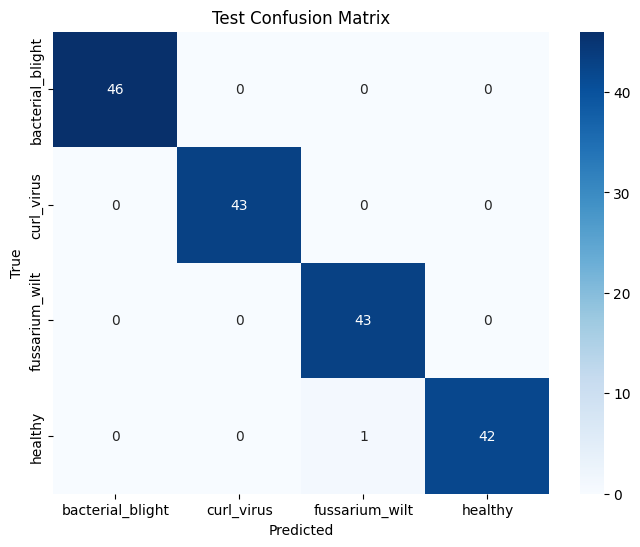


📊 Class-wise ROC & PR AUC:
              Class ROC AUC  PR AUC
0  bacterial_blight  1.0000  1.0000
1        curl_virus  1.0000  1.0000
2    fussarium_wilt  0.9991  0.9972
3           healthy  0.9986  0.9964

Accuracy 95% CI: [0.9829, 1.0000]
Cohen's Kappa: 0.9924
Brier Score: 0.0044
Mean PPV: 0.9943 | Mean NPV: 0.9981
T-test class0 vs class1: stat=0.4818, p=0.6303

✅ Ensemble saved as 'BEST.pth' for deployment.


In [ ]:

import os, time, psutil
import torch
from torch import nn, optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms, models
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, cohen_kappa_score, brier_score_loss
from sklearn.metrics import roc_auc_score, average_precision_score
from scipy.stats import ttest_ind

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


# DATASET
train_transform_aug = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),
    transforms.ToTensor(),
    transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225])
])

eval_transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225])
])

train_dataset = datasets.ImageFolder('/kaggle/working/cotton_train_aug', transform=train_transform_aug)
train_eval_dataset = datasets.ImageFolder('/kaggle/working/cotton_train_aug', transform=eval_transform)
val_dataset   = datasets.ImageFolder('/kaggle/working/cotton_split/val', transform=eval_transform)
test_dataset  = datasets.ImageFolder('/kaggle/working/cotton_split/test', transform=eval_transform)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
train_eval_loader = DataLoader(train_eval_dataset, batch_size=32, shuffle=False)
val_loader   = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader  = DataLoader(test_dataset, batch_size=32, shuffle=False)

class_names = train_dataset.classes
num_classes = len(class_names)


# MULTI-HEAD SELF-ATTENTION
class MultiHeadSelfAttention(nn.Module):
    def __init__(self, in_channels, num_heads=4, dropout=0.3):
        super().__init__()
        assert in_channels % num_heads == 0
        self.mha = nn.MultiheadAttention(embed_dim=in_channels, num_heads=num_heads, dropout=dropout, batch_first=True)
        self.dropout = nn.Dropout(dropout)
        self.norm = nn.LayerNorm(in_channels)

    def forward(self, x):
        b, c, h, w = x.size()
        x_flat = x.view(b, c, h*w).permute(0,2,1)
        attn_out, _ = self.mha(x_flat, x_flat, x_flat)
        attn_out = self.dropout(attn_out)
        attn_out = self.norm(attn_out + x_flat)
        out = attn_out.permute(0,2,1).view(b, c, h, w)
        return out


# MODEL WRAPPERS
class SqueezeNet_MHSA(nn.Module):
    def __init__(self, num_classes, num_heads=4, dropout=0.3, freeze_backbone=True):
        super().__init__()
        self.backbone = models.squeezenet1_1(weights=models.SqueezeNet1_1_Weights.DEFAULT)
        if freeze_backbone:
            for p in self.backbone.parameters(): p.requires_grad = False
        self.features = self.backbone.features
        last_channels = 512
        self.mhsa = MultiHeadSelfAttention(last_channels, num_heads=num_heads, dropout=dropout)
        self.classifier = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Flatten(),
            nn.Dropout(dropout),
            nn.Linear(last_channels, num_classes)
        )
    def forward(self, x):
        f = self.features(x)
        f = self.mhsa(f)
        return self.classifier(f)

class ShuffleNetV2_MHSA(nn.Module):
    def __init__(self, num_classes, num_heads=4, dropout=0.3, freeze_backbone=True):
        super().__init__()
        self.backbone = models.shufflenet_v2_x1_0(weights=models.ShuffleNet_V2_X1_0_Weights.DEFAULT)
        if freeze_backbone:
            for p in self.backbone.parameters(): p.requires_grad = False
        self.backbone.fc = nn.Identity()
        self.mhsa = MultiHeadSelfAttention(1024, num_heads=num_heads, dropout=dropout)
        self.classifier = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Flatten(),
            nn.Dropout(dropout),
            nn.Linear(1024, num_classes)
        )
    def forward(self, x):
        f = self.backbone(x).unsqueeze(-1).unsqueeze(-1)
        f = self.mhsa(f)
        return self.classifier(f)

class EfficientNetB0_MHSA(nn.Module):
    def __init__(self, num_classes, num_heads=4, dropout=0.3, freeze_backbone=True):
        super().__init__()
        self.backbone = models.efficientnet_b0(weights=models.EfficientNet_B0_Weights.DEFAULT)
        if freeze_backbone:
            for p in self.backbone.parameters(): p.requires_grad = False
        self.backbone.classifier = nn.Identity()
        self.mhsa = MultiHeadSelfAttention(1280, num_heads=num_heads, dropout=dropout)
        self.classifier = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Flatten(),
            nn.Dropout(dropout),
            nn.Linear(1280, num_classes)
        )
    def forward(self, x):
        f = self.backbone.features(x)
        f = self.mhsa(f)
        return self.classifier(f)


squeezenet_model = SqueezeNet_MHSA(num_classes=num_classes).to(device)
shufflenet_model = ShuffleNetV2_MHSA(num_classes=num_classes).to(device)
efficientnet_model = EfficientNetB0_MHSA(num_classes=num_classes).to(device)

models_list = [squeezenet_model, shufflenet_model, efficientnet_model]

criterion = nn.CrossEntropyLoss()
optimizer_list = [optim.Adam(m.parameters(), lr=1e-4, weight_decay=1e-4) for m in models_list]
scheduler_list = [optim.lr_scheduler.ReduceLROnPlateau(opt, 'min', patience=5) for opt in optimizer_list]


num_epochs = 50
for idx, model in enumerate(models_list):
    best_val_loss = float('inf'); patience_counter = 0
    optimizer = optimizer_list[idx]; scheduler = scheduler_list[idx]
    for epoch in range(num_epochs):
        model.train()
        running_loss, correct, total = 0,0,0
        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()
            _, preds = torch.max(outputs,1)
            correct += (preds==labels).sum().item()
            total += labels.size(0)
        train_loss = running_loss / len(train_loader)
        train_acc = correct / total

        # Validation
        model.eval()
        val_loss, val_correct, val_total = 0,0,0
        with torch.no_grad():
            for inputs, labels in val_loader:
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs)
                loss = criterion(outputs, labels)
                val_loss += loss.item()
                _, preds = torch.max(outputs,1)
                val_correct += (preds==labels).sum().item()
                val_total += labels.size(0)
        val_loss /= len(val_loader); val_acc=val_correct/val_total
        scheduler.step(val_loss)

        print(f"[Model {idx+1}] Epoch {epoch+1}/{num_epochs} | Train Loss: {train_loss:.4f}, Acc: {train_acc:.4f} | Val Loss: {val_loss:.4f}, Acc: {val_acc:.4f}")

        if val_loss<best_val_loss:
            best_val_loss=val_loss
            torch.save(model.state_dict(), f"best_model_{idx}.pth")
            patience_counter=0
        else:
            patience_counter+=1
            if patience_counter>=5:
                print("Early stopping!")
                break


# ENSEMBLE PREDICTION
def get_preds_ensemble(loader, models_list):
    probs_list=[]
    with torch.no_grad():
        for inputs, _ in loader:
            inputs = inputs.to(device)
            outputs_sum = 0
            for model in models_list:
                model.eval()
                outputs_sum += torch.softmax(model(inputs),1)
            probs_avg = outputs_sum / len(models_list)
            probs_list.append(probs_avg.cpu().numpy())
    probs_all = np.vstack(probs_list)
    preds_all = np.argmax(probs_all, axis=1)
    labels_all = np.array([y for _, y in loader.dataset])
    return labels_all, preds_all, probs_all

train_labels, train_preds, train_probs = get_preds_ensemble(train_eval_loader, models_list)
val_labels, val_preds, val_probs       = get_preds_ensemble(val_loader, models_list)
test_labels, test_preds, test_probs    = get_preds_ensemble(test_loader, models_list)


# METRICS & EVALUATION
print("\n Train Classification Report:")
print(classification_report(train_labels, train_preds, target_names=class_names, digits=4))
print("\n Validation Classification Report:")
print(classification_report(val_labels, val_preds, target_names=class_names, digits=4))
print("\n Test Classification Report:")
print(classification_report(test_labels, test_preds, target_names=class_names, digits=4))

# Confusion Matrix
cm = confusion_matrix(test_labels, test_preds)
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted"); plt.ylabel("True"); plt.title("Test Confusion Matrix")
plt.show()

# ROC & PR AUC
test_labels_onehot = np.eye(num_classes)[test_labels]
roc_auc_list = [roc_auc_score(test_labels_onehot[:,i], test_probs[:,i]) for i in range(num_classes)]
pr_auc_list  = [average_precision_score(test_labels_onehot[:,i], test_probs[:,i]) for i in range(num_classes)]
auc_df = pd.DataFrame({"Class": class_names, "ROC AUC":[f"{x:.4f}" for x in roc_auc_list], "PR AUC":[f"{x:.4f}" for x in pr_auc_list]})
print("\n Class-wise ROC & PR AUC:")
print(auc_df)

# Bootstrap CI (corrected)
n_samples = len(test_labels)
boot_acc = []
for _ in range(1000):
    idx = np.random.choice(n_samples, n_samples, replace=True)
    boot_acc.append(np.mean(test_labels[idx]==test_preds[idx]))
ci_low, ci_high = np.percentile(boot_acc, [2.5,97.5])
print(f"\nAccuracy 95% CI: [{ci_low:.4f}, {ci_high:.4f}]")

# Extra Metrics
kappa = cohen_kappa_score(test_labels, test_preds)
brier = brier_score_loss(test_labels_onehot.flatten(), test_probs.flatten())
TP = np.diag(cm); FP = cm.sum(axis=0)-TP; FN = cm.sum(axis=1)-TP; TN = cm.sum()-(TP+FP+FN)
PPV = TP/(TP+FP+1e-8); NPV = TN/(TN+FN+1e-8)
ttest_res = ttest_ind(test_probs[:,0], test_probs[:,1])

print(f"Cohen's Kappa: {kappa:.4f}")
print(f"Brier Score: {brier:.4f}")
print(f"Mean PPV: {np.mean(PPV):.4f} | Mean NPV: {np.mean(NPV):.4f}")
print(f"T-test class0 vs class1: stat={ttest_res.statistic:.4f}, p={ttest_res.pvalue:.4f}")


# SAVE ENSEMBLE FOR DEPLOYMENT
torch.save({
    'squeezenet': squeezenet_model.state_dict(),
    'shufflenet': shufflenet_model.state_dict(),
    'efficientnet': efficientnet_model.state_dict(),
    'class_names': class_names
}, "BEST.pth")
print("\n Ensemble saved as 'BEST.pth' for deployment.")

In [18]:
!pip install grad-cam


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 53.4 MB/s eta 0:00:0000:0100:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.6 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 13.8 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 7.8 MB/s eta 0:00:0000:0100:01m
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 6.7 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.3 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.1 MB/s eta 0:00:0000:0100:01m
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 10.2 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 6.6 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 

# GRAD-CAM VISUALIZATION

In [19]:
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image


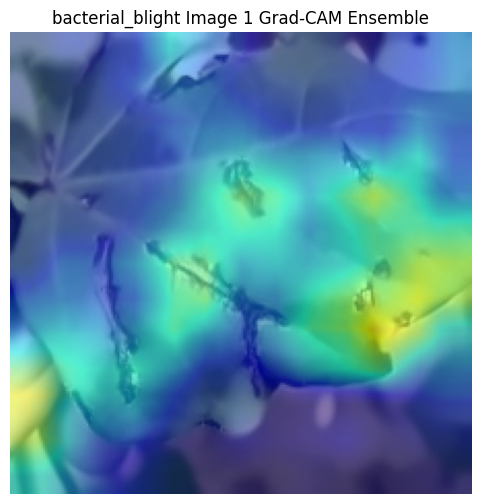

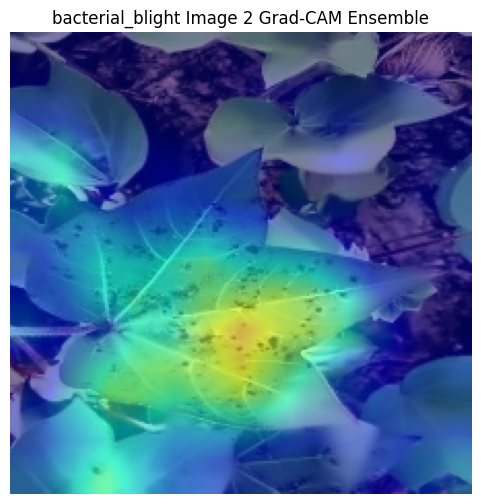

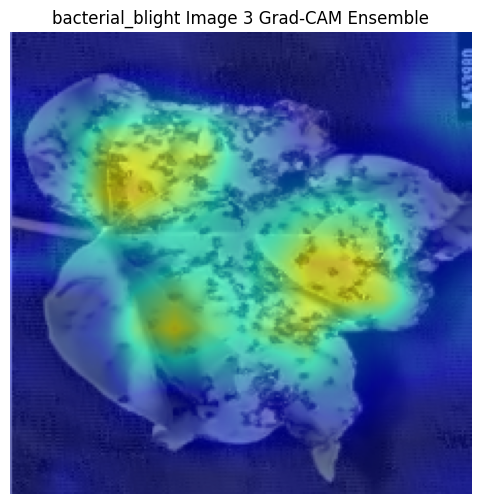

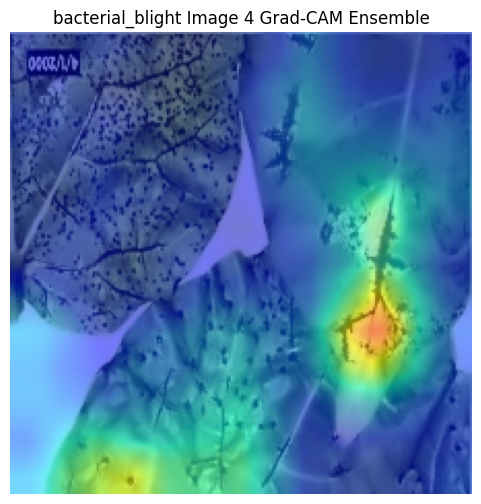

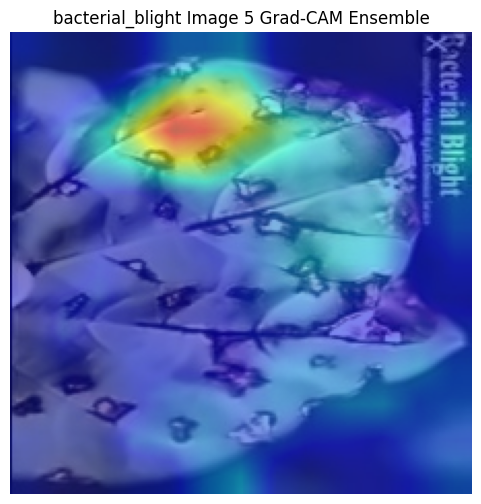

...

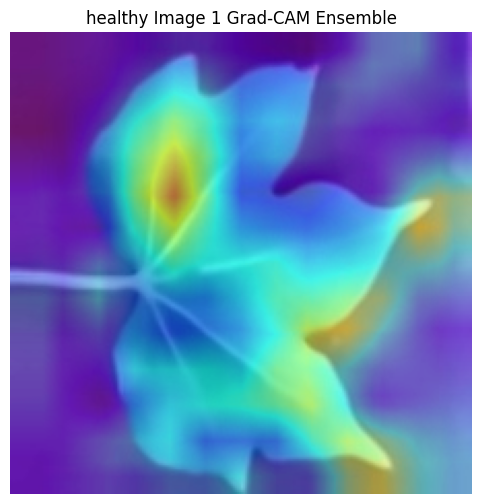

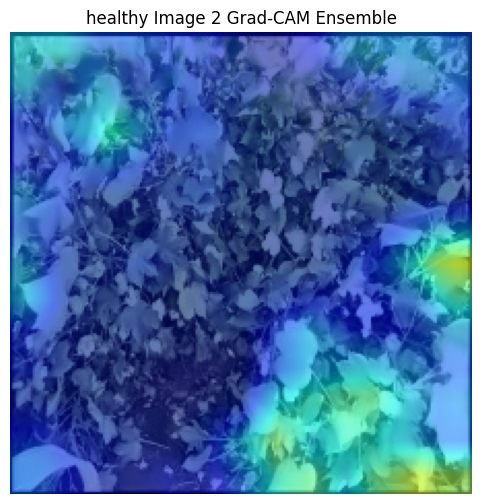

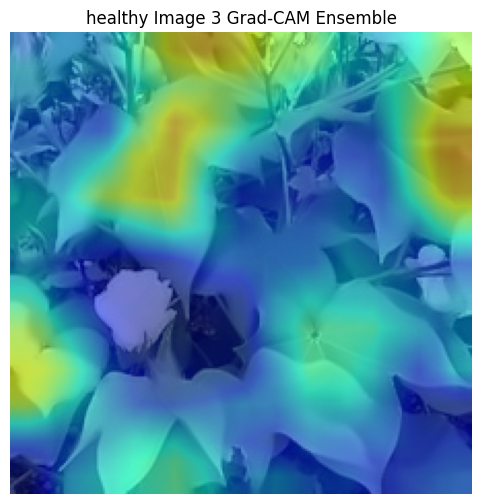

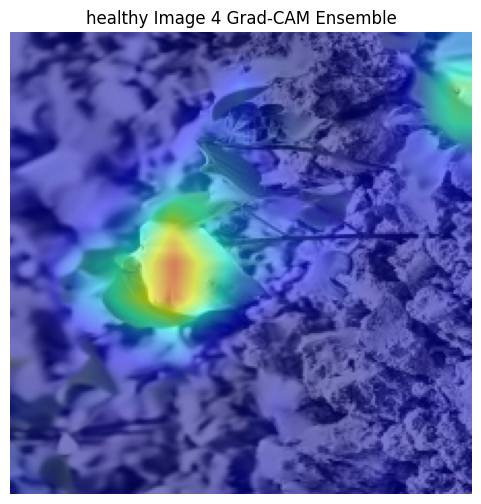

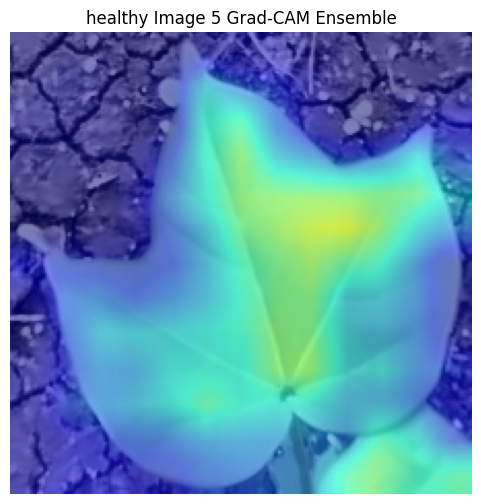

In [ ]:
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image


# GRAD-CAM VISUALIZATION
def plot_gradcam(models_list, loader, class_names, num_images=5):
    device = next(models_list[0].parameters()).device


    for model in models_list:
        model.eval()
        if isinstance(model, SqueezeNet_MHSA):
            for p in model.features[-1].parameters(): p.requires_grad = True
        elif isinstance(model, ShuffleNetV2_MHSA):
            for p in model.backbone.conv5.parameters(): p.requires_grad = True
        elif isinstance(model, EfficientNetB0_MHSA):
            for p in model.backbone.features[-1].parameters(): p.requires_grad = True

    for class_idx, class_name in enumerate(class_names):

        class_images = [(img, lbl) for img, lbl in loader.dataset if lbl==class_idx][:num_images]

        for i, (img_tensor, lbl) in enumerate(class_images):
            input_tensor = img_tensor.unsqueeze(0).to(device)
            input_tensor.requires_grad = True

            combined_map = 0
            for model in models_list:

                if isinstance(model, SqueezeNet_MHSA):
                    target_layer = model.features[-1]
                elif isinstance(model, ShuffleNetV2_MHSA):
                    target_layer = model.backbone.conv5
                elif isinstance(model, EfficientNetB0_MHSA):
                    target_layer = model.backbone.features[-1]

                cam = GradCAM(model=model, target_layers=[target_layer])
                targets = [ClassifierOutputTarget(lbl)]
                grayscale_cam = cam(input_tensor, targets=targets)[0]
                combined_map += grayscale_cam

            combined_map /= len(models_list)


            img_np = img_tensor.permute(1,2,0).cpu().numpy()
            img_np = (img_np - img_np.min()) / (img_np.max() - img_np.min() + 1e-8)

            # Overlay CAM
            visualization = show_cam_on_image(img_np, combined_map, use_rgb=True)

            plt.figure(figsize=(6,6))
            plt.imshow(visualization)
            plt.title(f"{class_name} Image {i+1} Grad-CAM Ensemble")
            plt.axis('off')
            plt.show()


plot_gradcam(models_list, test_loader, class_names, num_images=5)